### In this notebook we used a pre trained yolo on speed sings detection, and fine tune it on arabic signs.

In [ ]:
# import os

# # Path to merged dataset
# merged_dir = '/kaggle/input/almost-clean-ss'

# # Collect all unique classes
# unique_classes = set()

# # Loop over all subsets
# for subset in ['train', 'valid', 'test']:
#     label_dir = os.path.join(merged_dir, subset, 'labels')
#     if not os.path.exists(label_dir):
#         continue
#     for file in os.listdir(label_dir):
#         if file.endswith('.txt'):
#             with open(os.path.join(label_dir, file), 'r') as f:
#                 for line in f:
#                     if line.strip():
#                         class_id = int(line.strip().split()[0])
#                         unique_classes.add(class_id)

# # Sort and display
# unique_classes = sorted(list(unique_classes))
# print(f"✅ Found {len(unique_classes)} unique class IDs:")
# print(unique_classes)


##  Install And Import Essential Libreries</b> 


In [4]:
!pip install --upgrade ultralytics ray


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 15.1 MB/s eta 0:00:00 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.3/68.3 MB 19.5 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: ray
    Found existing installation: ray 2.5.1
    Uninstalling ray-2.5.1:
      Successfully uninstalled ray-2.5.1


In [ ]:
# # Install Essential Libraries
# !pip install ultralytics

In [5]:
# Import Essential Libraries
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [4]:
# Configure the visual appearance of Seaborn plots
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

##  Dataset
 Show Original Images Before Detect 


Show Some Images From TrainSet

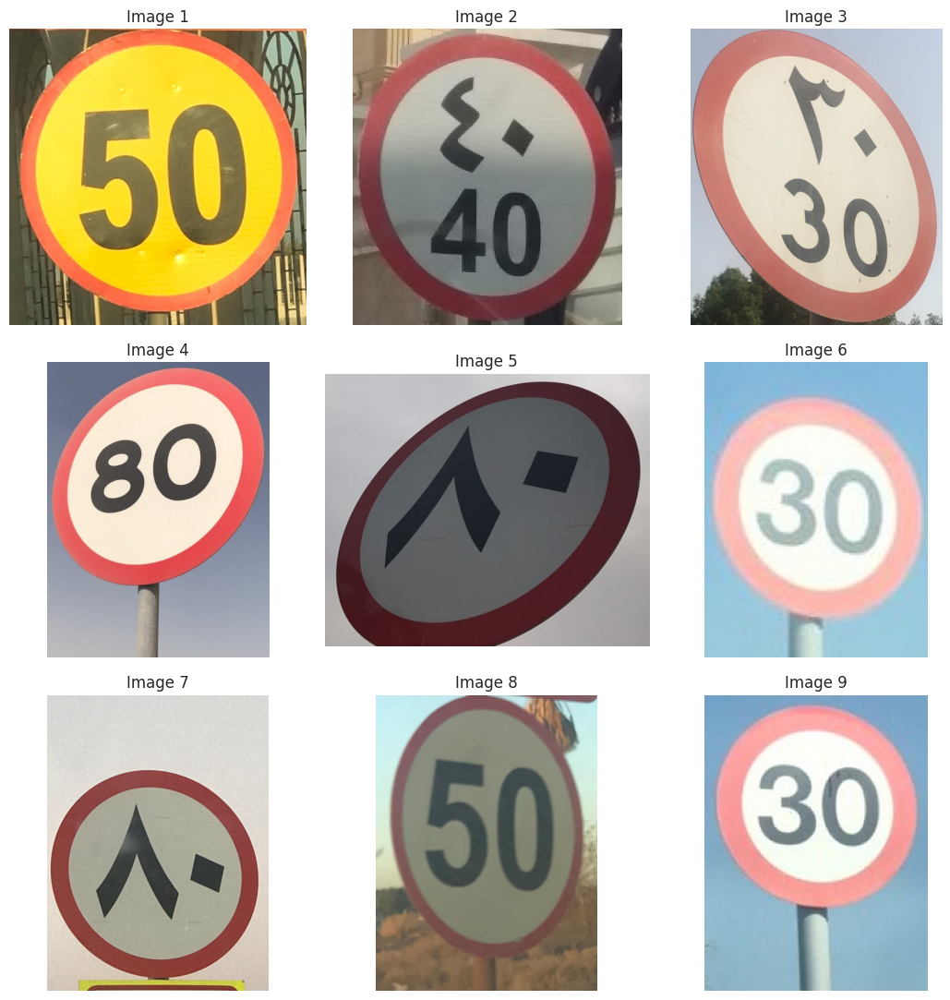

In [5]:
Image_dir = '/kaggle/input/ss-imgs/rawdata'

num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

Get Shape Of An Image For Using In Training Step

In [6]:
# Get the size of the image
image = cv2.imread("/kaggle/input/ss-imgs/rawdata/speed_100-38977.JPG")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

The image has dimensions 1487x1543 and 3 channels.


# data labeling and preprocessing
### arabic signs labels were not labeled, so we used the model to label them and find their bbox.

In [16]:
# arabic_images_dir = "/kaggle/input/ss-imgs/rawdata/"
# results = Final_model.predict(source=arabic_images_dir, save_txt=True, imgsz=640)


image 1/1 /kaggle/input/ss-imgs/rawdata/speed_100-38977.JPG: 640x640 1 Speed Limit 40, 1 Speed Limit 70, 8.1ms
Speed: 3.3ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict
1 label saved to runs/detect/predict/labels


In [9]:
import os

# Paths
image_dir = "/kaggle/input/ss-imgs/rawdata"
label_dir = "/kaggle/working/runs/detect/predict/labels"

# List all images and expected label files
images = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.JPG'))]
missing_labels = []

for img in images:
    txt_file = os.path.join(label_dir, os.path.splitext(img)[0] + '.txt')
    if not os.path.exists(txt_file):
        missing_labels.append(img)
        # Create empty file if no detections
        # open(txt_file, 'a').close()  # Creates empty .txt file

print(f"Missing labels: {missing_labels}")

Missing labels: ['speed_100-39376.JPG', 'speed_60-48091.JPG', 'speed_40-45487.JPG', 'speed_60-48742.JPG', 'speed_50-46180.JPG', 'speed_60-48637.JPG', 'speed_100-39418.JPG', 'speed_60-48112.JPG', 'speed_40-45004.JPG', 'speed_50-46075.JPG', 'speed_40-44248.JPG', 'speed_60-49120.JPG', 'speed_60-48868.JPG', 'speed_100-39859.JPG', 'speed_100-39481.JPG', 'speed_30-43009.JPG', 'speed_40-45550.JPG', 'speed_50-45802.JPG', 'speed_60-48700.JPG', 'speed_40-45298.JPG', 'speed_60-48070.JPG', 'speed_80-52354.JPG', 'speed_80-50695.JPG', 'speed_60-48763.JPG', 'speed_50-45865.JPG', 'speed_40-45025.JPG', 'speed_30-41497.JPG', 'speed_60-49372.JPG', 'speed_80-51703.JPG', 'speed_80-50758.JPG', 'speed_40-45466.JPG', 'speed_100-39439.JPG', 'speed_40-44962.JPG', 'speed_50-47881.JPG', 'speed_40-45172.JPG', 'speed_80-50674.JPG']


In [13]:
import os
import shutil

# Define paths
image_source = "/kaggle/input/ss-imgs/rawdata"  # Original images
label_source = "/kaggle/working/runs/detect/predict/labels"  # Predicted labels
output_dir = "/kaggle/working/temp_data"  # Output folder

# Create output directories
os.makedirs(os.path.join(output_dir, "images"), exist_ok=True)
os.makedirs(os.path.join(output_dir, "labels"), exist_ok=True)

# Get list of all images and filter out missing_labels
all_images = [f for f in os.listdir(image_source) if f.endswith(('.jpg', '.JPG', '.png'))]
# missing_labels = ['speed_100-39019.JPG', 'speed_100-39500.JPG']  # Add your missing files here
valid_images = [img for img in all_images if img not in missing_labels]

# Copy images and their corresponding labels
for img in valid_images:
    # Copy image
    img_src = os.path.join(image_source, img)
    img_dst = os.path.join(output_dir, "images", img)
    shutil.copy2(img_src, img_dst)
    
    # Copy label (if exists)
    label_name = os.path.splitext(img)[0] + '.txt'
    label_src = os.path.join(label_source, label_name)
    label_dst = os.path.join(output_dir, "labels", label_name)
    
    if os.path.exists(label_src):
        shutil.copy2(label_src, label_dst)
    else:
        # Create empty label file if missing (optional)
        open(label_dst, 'a').close()

print(f"Created combined dataset in {output_dir}")
print(f"Excluded {len(missing_labels)} images: {missing_labels}")

Created combined dataset in /kaggle/working/temp_data
Excluded 36 images: ['speed_100-39376.JPG', 'speed_60-48091.JPG', 'speed_40-45487.JPG', 'speed_60-48742.JPG', 'speed_50-46180.JPG', 'speed_60-48637.JPG', 'speed_100-39418.JPG', 'speed_60-48112.JPG', 'speed_40-45004.JPG', 'speed_50-46075.JPG', 'speed_40-44248.JPG', 'speed_60-49120.JPG', 'speed_60-48868.JPG', 'speed_100-39859.JPG', 'speed_100-39481.JPG', 'speed_30-43009.JPG', 'speed_40-45550.JPG', 'speed_50-45802.JPG', 'speed_60-48700.JPG', 'speed_40-45298.JPG', 'speed_60-48070.JPG', 'speed_80-52354.JPG', 'speed_80-50695.JPG', 'speed_60-48763.JPG', 'speed_50-45865.JPG', 'speed_40-45025.JPG', 'speed_30-41497.JPG', 'speed_60-49372.JPG', 'speed_80-51703.JPG', 'speed_80-50758.JPG', 'speed_40-45466.JPG', 'speed_100-39439.JPG', 'speed_40-44962.JPG', 'speed_50-47881.JPG', 'speed_40-45172.JPG', 'speed_80-50674.JPG']


In [16]:
import os
import re

# Paths
label_dir = "/kaggle/working/temp_data/labels"  # Directory with .txt label files
image_dir = "/kaggle/working/temp_data/images"  # Directory with images (for filename reference)

# Your class names from data.yaml (indexes 0-14)
class_names = [
    'Green Light', 'Red Light', 'Speed Limit 10', 'Speed Limit 100',
    'Speed Limit 110', 'Speed Limit 120', 'Speed Limit 20', 'Speed Limit 30',
    'Speed Limit 40', 'Speed Limit 50', 'Speed Limit 60', 'Speed Limit 70',
    'Speed Limit 80', 'Speed Limit 90', 'Stop'
]

# Create mapping: speed value → class index
speed_to_class = {}
for idx, name in enumerate(class_names):
    if "Speed Limit" in name:
        speed = int(name.split()[-1])  # Extract numeric value (e.g., 100)
        speed_to_class[speed] = idx

# Process all label files
for label_file in os.listdir(label_dir):
    if not label_file.endswith(".txt"):
        continue
    
    # Get corresponding image name
    image_name = label_file.replace(".txt", ".JPG")
    image_path = os.path.join(image_dir, image_name)
    
    # Extract speed value from image filename (e.g., "100" from "speed_100-38977.JPG")
    match = re.search(r"speed_(\d+)", image_name)
    if not match:
        print(f"Skipping {image_name}: no speed value in filename")
        continue
    
    speed = int(match.group(1))
    if speed not in speed_to_class:
        print(f"Skipping {image_name}: no class for Speed Limit {speed}")
        continue
    
    # Get correct class index
    correct_class = speed_to_class[speed]
    
    # Update the label file
    label_path = os.path.join(label_dir, label_file)
    with open(label_path, "r") as f:
        lines = f.readlines()
    
    new_lines = []
    for line in lines:
        parts = line.strip().split()
        if not parts:
            continue
        # Replace old class index with corrected one
        parts[0] = str(correct_class)
        new_lines.append(" ".join(parts))
    
    # Write corrected labels
    with open(label_path, "w") as f:
        f.write("\n".join(new_lines))

print("Class indices updated successfully!")

Class indices updated successfully!


In [19]:
import os

label_dir = "/kaggle/working/temp_data/labels"  # Path to your labels

for label_file in os.listdir(label_dir):
    label_path = os.path.join(label_dir, label_file)
    
    with open(label_path, "r") as f:
        lines = f.readlines()
    
    # Keep only the first line (first object)
    if len(lines) > 1:
        with open(label_path, "w") as f:
            f.write(lines[0].strip())  # Overwrite with first line only
    
    # Ensure empty files stay empty (optional)
    elif len(lines) == 0:
        pass  # Do nothing (keep empty)

In [20]:
import shutil

# Paths
source_dir = "/kaggle/working/temp_data"
output_zip = "/kaggle/working/temp_data.zip"

# Create ZIP file
shutil.make_archive(
    base_name=output_zip.replace(".zip", ""),  # Remove extension
    format="zip",
    root_dir=source_dir
)

print(f"ZIP file created at: {output_zip}")

ZIP file created at: /kaggle/working/temp_data.zip


5.1.1. Training Step

In [6]:
# Build from YAML and transfer weights
Final_model = YOLO('/kaggle/input/speed_signs/tensorflow2/default/1/best.pt')  

# Training The Final Model
Result_Final_model_resume = Final_model.train(data="/kaggle/input/final-data/archive (2)/car/data.yaml",epochs = 8, batch = -1, optimizer = 'auto' )


Ultralytics 8.3.122 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/input/speed_signs/tensorflow2/default/1/best.pt, data=/kaggle/input/final-data/archive (2)/car/data.yaml, epochs=8, time=None, patience=100, batch=-1, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, 

100%|██████████| 755k/755k [00:00<00:00, 17.4MB/s]
2025-05-01 16:15:29,261	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2025-05-01 16:15:29,564	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.



                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

100%|██████████| 5.35M/5.35M [00:00<00:00, 75.2MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.2±0.2 ms, read: 8.6±3.6 MB/s, size: 31.7 KB)


train: Scanning /kaggle/input/final-data/archive (2)/car/train/labels... 4013 images, 3 backgrounds, 0 corrupt: 100%|██████████| 4013/4013 [00:13<00:00, 290.39it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/final-data/archive (2)/car/train is not writeable, cache not saved.
albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'
AutoBatch: Computing optimal batch size for imgsz=640 at 60.0% CUDA memory utilization.
AutoBatch: CUDA:0 (Tesla T4) 14.74G total, 0.33G reserved, 0.06G allocated, 14.35G free
      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output
     3013773       8.209         0.512         56.72         463.5        (1, 3, 640, 640)                    list
     3013773       16.42         0.661         18.43         179.6        (2, 3, 640, 640)                    list
     3013773       32.84         0.925         20.54         159.9        (4, 3, 640, 640)                    list
     3013773       65.67         1.441         25.53         150.3        (8, 3, 640, 640)                    list
     3013773       131.3         2.550

train: Scanning /kaggle/input/final-data/archive (2)/car/train/labels... 4013 images, 3 backgrounds, 0 corrupt: 100%|██████████| 4013/4013 [00:03<00:00, 1046.56it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/final-data/archive (2)/car/train is not writeable, cache not saved.
albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4.7±2.2 MB/s, size: 23.4 KB)


val: Scanning /kaggle/input/final-data/archive (2)/car/valid/labels... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:02<00:00, 270.12it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/final-data/archive (2)/car/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0004921875), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 8 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/8      7.87G     0.5003     0.7611     0.9673        102        640: 100%|██████████| 64/64 [00:44<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.21it/s]

                   all        801        944      0.934       0.88      0.948      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/8      7.86G     0.5126     0.6733     0.9748         94        640: 100%|██████████| 64/64 [00:42<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.51it/s]

                   all        801        944      0.932      0.875      0.942      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/8      7.85G     0.5279     0.7033     0.9713        100        640: 100%|██████████| 64/64 [00:42<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.44it/s]

                   all        801        944      0.927      0.823      0.911       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/8      7.85G     0.5237     0.7141     0.9844         97        640: 100%|██████████| 64/64 [00:42<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]

                   all        801        944      0.887      0.879      0.937      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/8      7.84G     0.5301      0.677     0.9784        100        640: 100%|██████████| 64/64 [00:42<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:05<00:00,  1.40it/s]

                   all        801        944      0.937      0.867      0.938      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        6/8      7.84G     0.5069     0.6179     0.9687        111        640: 100%|██████████| 64/64 [00:43<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.42it/s]

                   all        801        944      0.934      0.879      0.949      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        7/8      7.87G     0.4931     0.5977     0.9637         97        640: 100%|██████████| 64/64 [00:41<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.44it/s]

                   all        801        944      0.957      0.875       0.96      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        8/8      7.87G     0.4765      0.546     0.9547        101        640: 100%|██████████| 64/64 [00:43<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:04<00:00,  1.41it/s]

                   all        801        944      0.952      0.893      0.956      0.824



8 epochs completed in 0.108 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.122 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:07<00:00,  1.07s/it]


                   all        801        944      0.953      0.892      0.956      0.824
           Green Light         87        122      0.885      0.695      0.836        0.5
             Red Light         74        108       0.89      0.672      0.824      0.512
       Speed Limit 100         52         52      0.966      0.942      0.981      0.882
       Speed Limit 110         17         17      0.749      0.882      0.935      0.845
       Speed Limit 120         60         60          1      0.946      0.988      0.916
        Speed Limit 20         56         56      0.992      0.982      0.986      0.872
        Speed Limit 30         71         74       0.98      0.959      0.988      0.922
        Speed Limit 40         53         55      0.978      0.964      0.992      0.885
        Speed Limit 50         68         71          1      0.872      0.961       0.86
        Speed Limit 60         76         76      0.946      0.917      0.961      0.868
        Speed Limit 7


image 1/1 /kaggle/input/ss-imgs/rawdata/speed_100-39019.JPG: 640x640 1 Speed Limit 100, 5.7ms
Speed: 3.0ms preprocess, 5.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


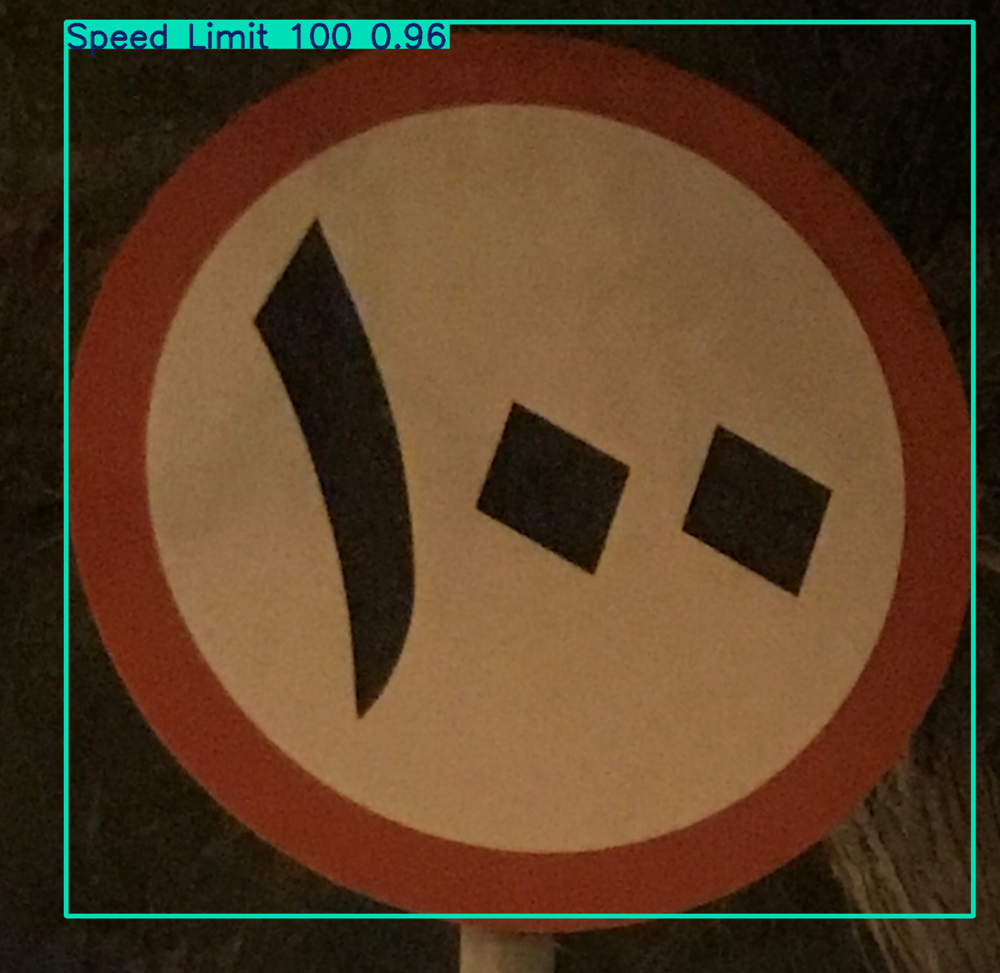

In [7]:


# Use the model to detect object
image = "/kaggle/input/ss-imgs/rawdata/speed_100-39019.JPG"
result_predict = Final_model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))


image 1/1 /kaggle/input/ss-imgs/rawdata/speed_100-38977.JPG: 640x640 1 Speed Limit 100, 6.5ms
Speed: 3.4ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


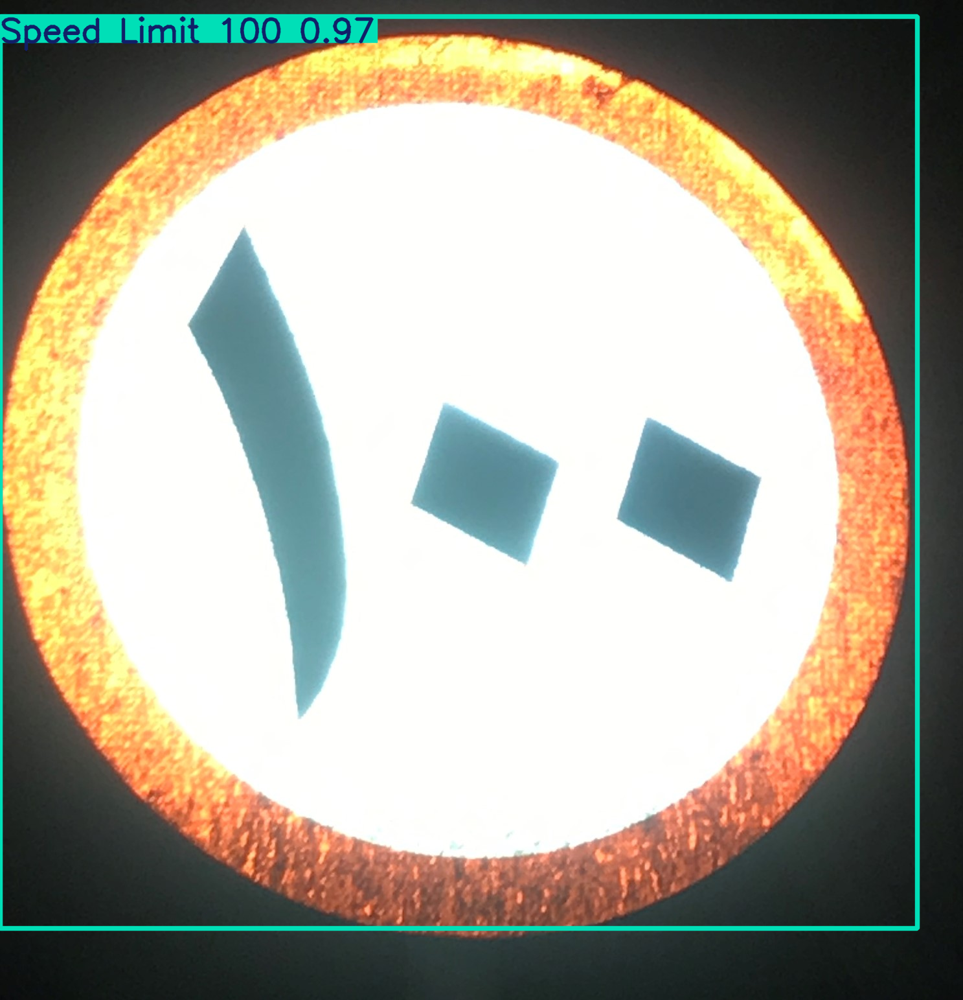

In [8]:
# # Use a pretrained YOLOv8n model
# model = YOLO("yolov8n.pt") 

# Use the model to detect object
image = "/kaggle/input/ss-imgs/rawdata/speed_100-38977.JPG"
result_predict = Final_model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))


image 1/1 /kaggle/input/ss-imgs/rawdata/speed_40-44563.JPG: 544x640 1 Speed Limit 40, 69.0ms
Speed: 3.0ms preprocess, 69.0ms inference, 1.4ms postprocess per image at shape (1, 3, 544, 640)


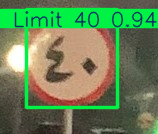

In [9]:
# # Use a pretrained YOLOv8n model
# model = YOLO("yolov8n.pt") 

# Use the model to detect object
image = "/kaggle/input/ss-imgs/rawdata/speed_40-44563.JPG"
result_predict = Final_model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))


image 1/1 /kaggle/input/ss-imgs/rawdata/speed_60-49288.JPG: 640x640 1 Speed Limit 60, 9.8ms
Speed: 2.9ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


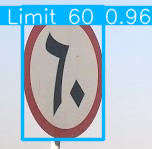

In [11]:
# # Use a pretrained YOLOv8n model
# model = YOLO("yolov8n.pt") 

# Use the model to detect object
image = "/kaggle/input/ss-imgs/rawdata/speed_60-49288.JPG"
result_predict = Final_model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

***5.1.2. Validation Step***

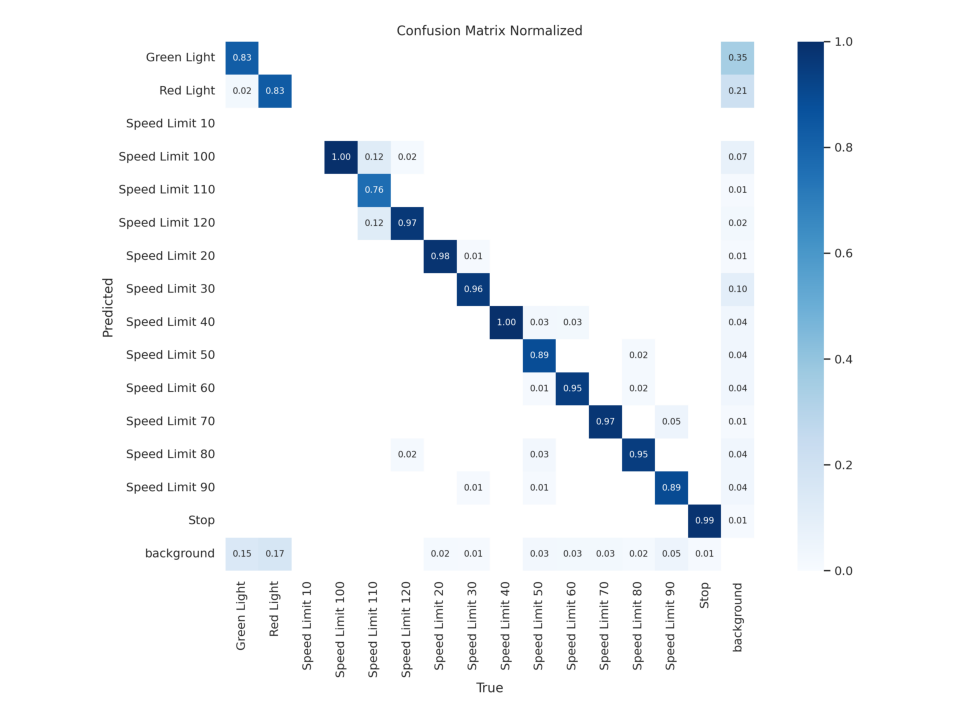

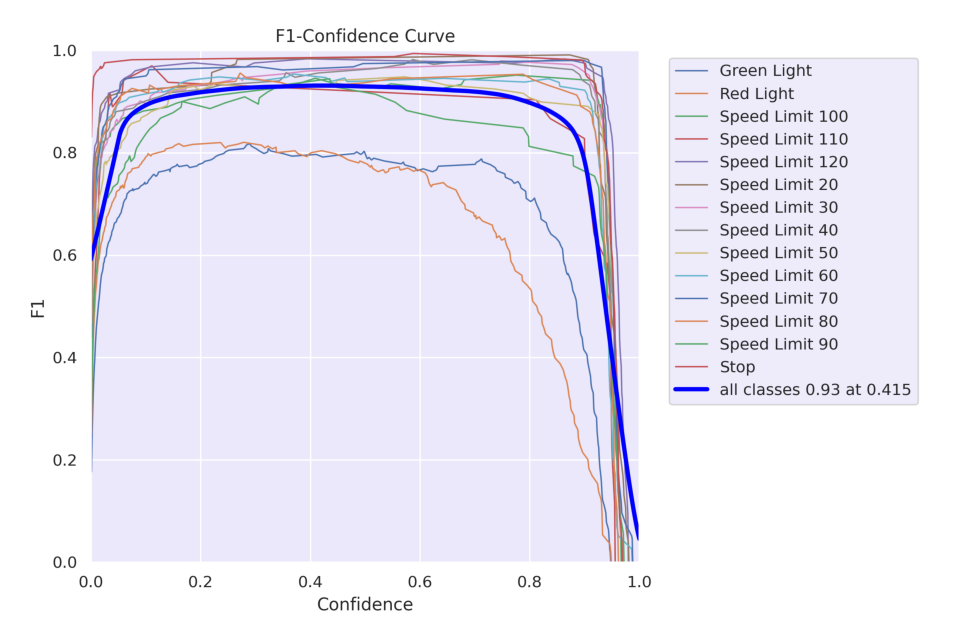

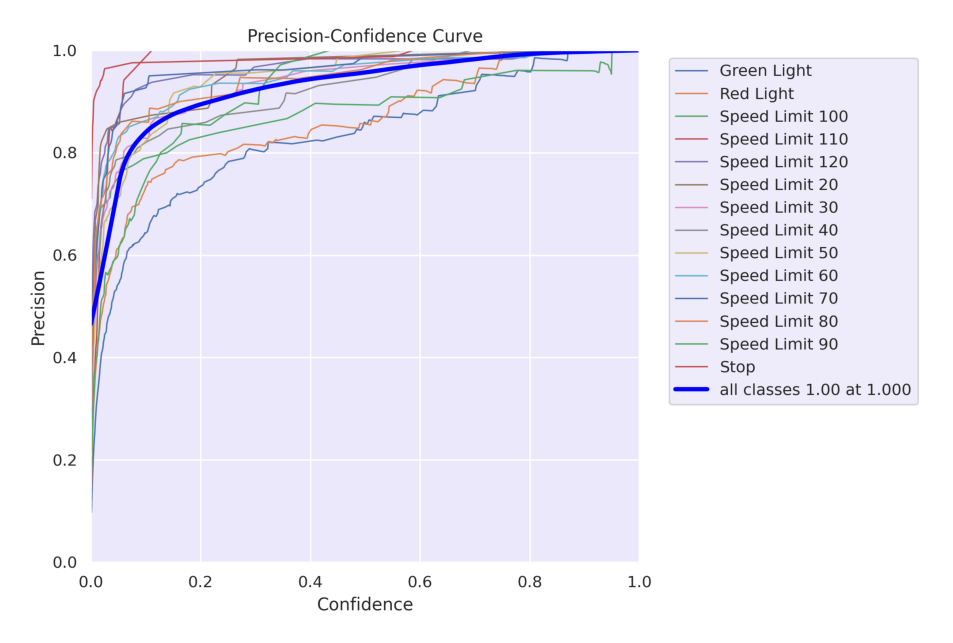

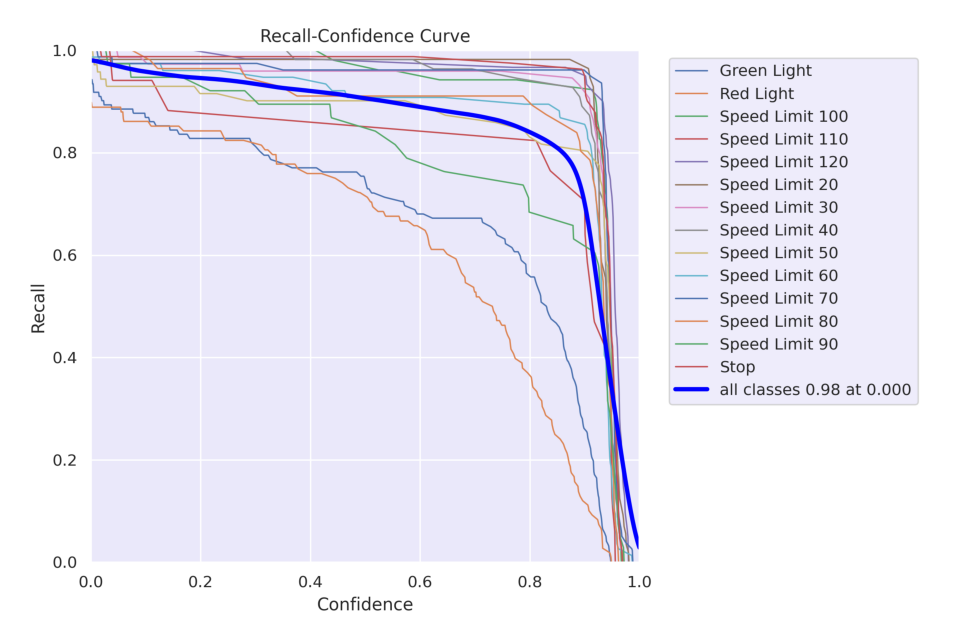

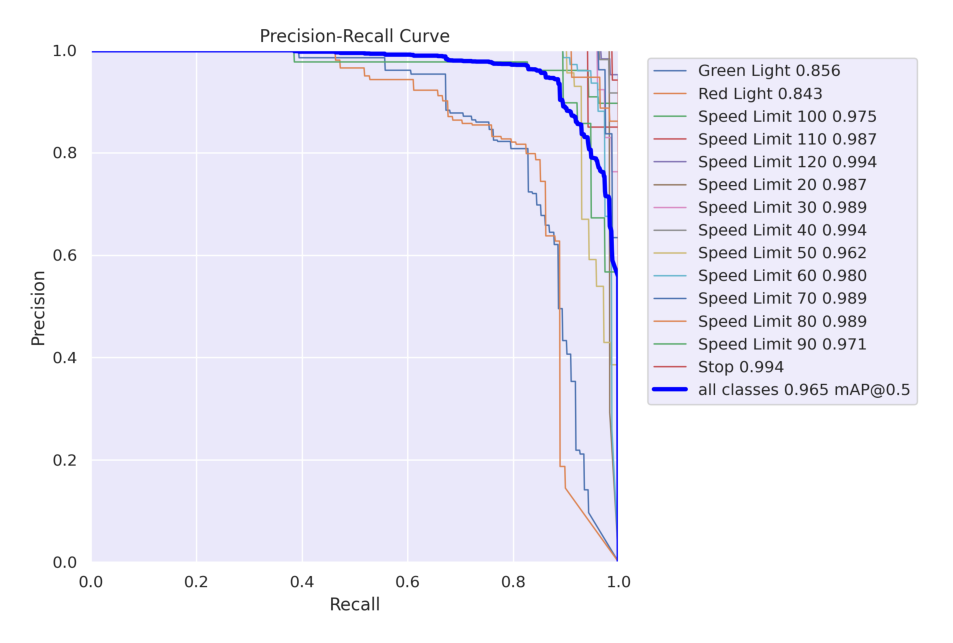

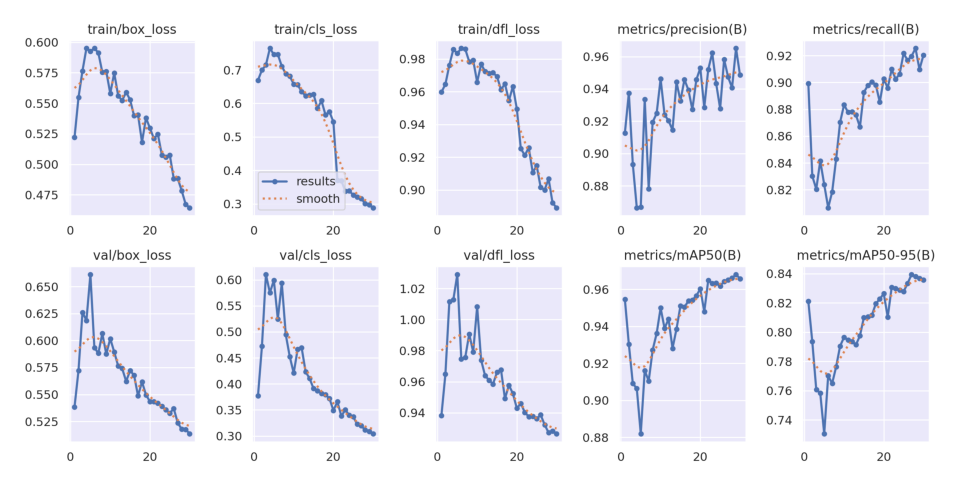

In [24]:
import os
import cv2
import matplotlib.pyplot as plt

def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = '/kaggle/working/runs/detect/train'

# Display the images
display_images(post_training_files_path, image_files)


In [25]:
Result_Final_model = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')
Result_Final_model.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
20,21,871.388,0.52104,0.37009,0.92529,0.92839,0.89589,0.94791,0.81023,0.54323,0.36571,0.94599,0.000179,0.000179,0.000179
21,22,909.956,0.52468,0.36946,0.92115,0.95206,0.90983,0.96493,0.83071,0.54192,0.33816,0.94022,0.000161,0.000161,0.000161
22,23,949.312,0.50761,0.33787,0.92583,0.96221,0.90251,0.96329,0.82979,0.53900,0.35013,0.93747,0.000144,0.000144,0.000144
23,24,988.694,0.50595,0.33957,0.91068,0.94329,0.90634,0.96332,0.82883,0.53569,0.33961,0.93761,0.000127,0.000127,0.000127
24,25,1027.670,0.50756,0.32600,0.91480,0.92773,0.92173,0.96181,0.82774,0.53271,0.33651,0.93611,0.000109,0.000109,0.000109
25,26,1066.050,0.48825,0.32101,0.90158,0.95827,0.91655,0.96425,0.83319,0.53688,0.32237,0.93857,0.000092,0.000092,0.000092
26,27,1105.100,0.48839,0.31588,0.90006,0.94735,0.91959,0.96499,0.83945,0.52379,0.31943,0.93227,0.000075,0.000075,0.000075
27,28,1143.540,0.47841,0.30082,0.90681,0.94072,0.92550,0.96614,0.83808,0.51773,0.31138,0.92710,0.000057,0.000057,0.000057
28,29,1182.500,0.46731,0.29708,0.89204,0.96513,0.90975,0.96808,0.83671,0.51769,0.30846,0.92807,0.000040,0.000040,0.000040
29,30,1220.190,0.46449,0.28872,0.88917,0.94852,0.92042,0.96576,0.83576,0.51356,0.30409,0.92643,0.000023,0.000023,0.000023


In [ ]:
# Read the results.csv file as a pandas dataframe
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

<div style="color:white;display:fill;border-radius:8px;
            background-color:#03112A;font-size:150%;
            letter-spacing:1.0px;background-image: url(https://i.imgur.com/GVd0La1.png)">
    <p style="padding: 8px;color:white;"><b><b><span style='color:#e61227''>5.2 |</span></b> Validation of the Model By TestSet </b></p>
</div>

In [26]:
# Loading the best performing model
Valid_model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.122 🚀 Python-3.10.12 torch-2.0.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.5 ms, read: 21.8±10.8 MB/s, size: 11.2 KB)


val: Scanning /kaggle/input/cardetection/car/valid/labels... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:01<00:00, 749.35it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/cardetection/car/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:07<00:00,  6.94it/s]


                   all        801        944      0.948       0.92      0.965       0.84
           Green Light         87        122      0.831      0.766      0.863      0.526
             Red Light         74        108      0.853      0.759      0.843      0.536
       Speed Limit 100         52         52      0.896      0.996      0.974      0.879
       Speed Limit 110         17         17          1      0.858      0.987      0.911
       Speed Limit 120         60         60      0.983      0.982      0.994      0.919
        Speed Limit 20         56         56      0.987      0.982      0.987      0.884
        Speed Limit 30         71         74      0.962      0.959      0.989      0.926
        Speed Limit 40         53         55      0.932      0.982      0.994      0.884
        Speed Limit 50         68         71      0.967      0.901      0.962      0.873
        Speed Limit 60         76         76       0.96      0.937       0.98      0.893
        Speed Limit 7


0: 640x640 1 Speed Limit 50, 1 Speed Limit 80, 7.4ms
Speed: 1.6ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 1 Speed Limit 110, 7.4ms
Speed: 4.4ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 120, 7.4ms
Speed: 3.5ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 40, 7.4ms
Speed: 3.5ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 120, 7.4ms
Speed: 3.2ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 120, 7.4ms
Speed: 2.9ms preprocess, 7.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 7.4ms
Speed: 3.1ms preprocess, 7.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 80, 7.4ms
Speed:

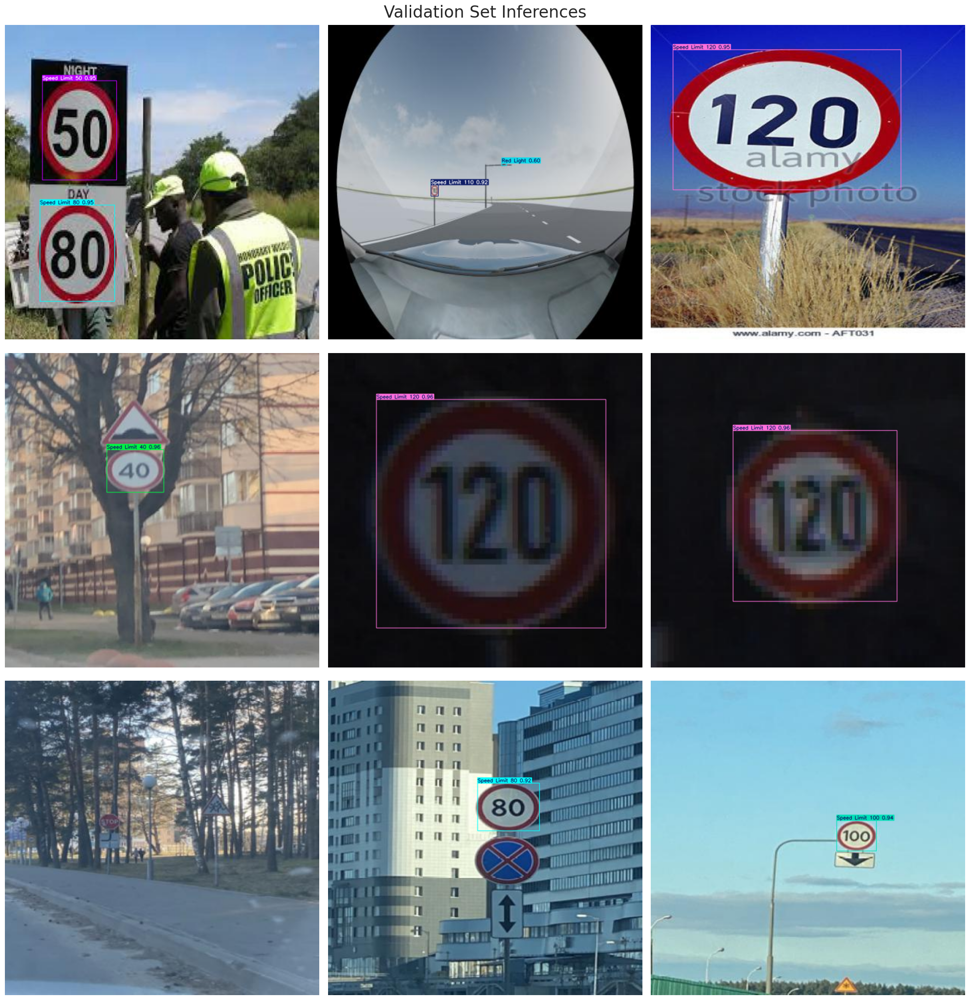

In [27]:
# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to validation images
dataset_path = '/kaggle/input/cardetection/car'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])
            
            # Load image
            image = cv2.imread(image_path)
            
            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)
                
                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
                
                # Predict with the model
                results = Valid_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)
                
                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()


## Save Model 


In [ ]:
Final_model.save('best_ar.pt')